In [1]:
%pip install folium

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster

In [3]:
data = pd.read_csv("cleaned1.csv")
data["Cuisines"].fillna("Unknown",inplace=True)
data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [4]:
restaurant_map = folium.Map(location=[data['Latitude'].mean(),data['Longitude'].mean()],zoom_start=10)

In [5]:
# Creating the marker for each restaurant in the map
for index,row in data.iterrows():
    folium.CircleMarker(
        location = [row["Latitude"],row["Longitude"]],
        radius = 5,
        color = 'blue',
        fill = True,
        fill_color = 'red',
        fill_opacity = 0.6,
        popup=row["Restaurant Name"]
    ).add_to(restaurant_map)

In [6]:
restaurant_map

In [7]:
restaurant_map.save("restaurant_distribution.html")

In [8]:
#Grouping the restaurant based on Locality
grouped = data.groupby("Locality")
restaurant_count_by_city = grouped.size().reset_index(name="Restaurant Count")
restaurant_count_by_city

,Locality,Restaurant Count
0,"ILD Trade Centre Mall, Sohna Road",2
1,"12th Square Building, Banjara Hills",1
2,"A Hotel, Gurdev Nagar",1
3,"ARSS Mall, Paschim Vihar",1
4,Aaya Nagar,1
...,...,...
1203,ayyolu,1
1204,guas Claras,3
1205,"ibis New Delhi, Aerocity",2
1206,mitk_y,1


In [9]:
# Calculate stastics by locality
average_rating_by_city = grouped["Aggregate rating"].mean().reset_index(name="Average Rating")
average_price_by_city = grouped["Average Cost for two"].mean().reset_index(name = "Average Price")
average_price_by_city

,Locality,Average Price
0,"ILD Trade Centre Mall, Sohna Road",575.000000
1,"12th Square Building, Banjara Hills",1500.000000
2,"A Hotel, Gurdev Nagar",800.000000
3,"ARSS Mall, Paschim Vihar",500.000000
4,Aaya Nagar,500.000000
...,...,...
1203,ayyolu,35.000000
1204,guas Claras,86.666667
1205,"ibis New Delhi, Aerocity",900.000000
1206,mitk_y,70.000000


In [10]:
Locality_with_highest_rating = average_rating_by_city[average_rating_by_city["Average Rating"]==average_rating_by_city["Average Rating"]]
Locality_with_highest_rating

,Locality,Average Rating
0,"ILD Trade Centre Mall, Sohna Road",3.050000
1,"12th Square Building, Banjara Hills",4.300000
2,"A Hotel, Gurdev Nagar",3.600000
3,"ARSS Mall, Paschim Vihar",3.100000
4,Aaya Nagar,0.000000
...,...,...
1203,ayyolu,4.300000
1204,guas Claras,3.666667
1205,"ibis New Delhi, Aerocity",1.550000
1206,mitk_y,4.200000


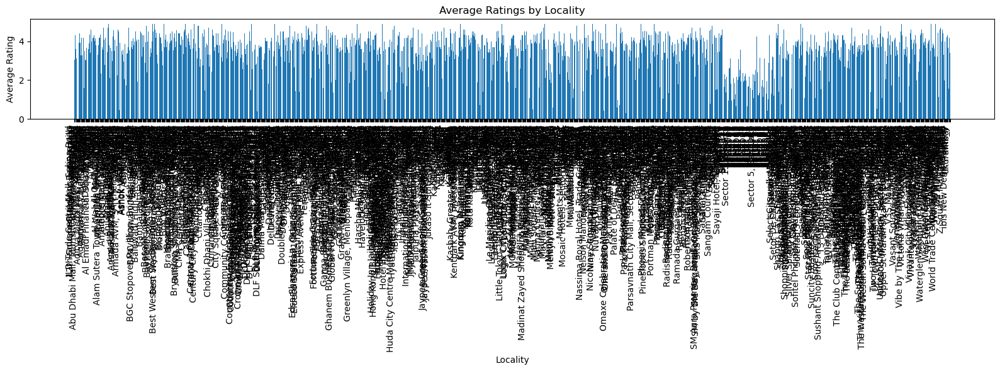

In [11]:
# Identifying the patterns
plt.figure(figsize=(16,6))
plt.bar(average_rating_by_city['Locality'],average_rating_by_city['Average Rating'])
plt.xlabel("Locality")
plt.ylabel("Average Rating")
plt.title("Average Ratings by Locality")
plt.xticks(rotation=90,ha='right')
plt.tight_layout()
plt.show()